# 02. Training and Improving Neural Networks

Transfer learning (TL) - a machine learning technique where a model pre-trained on one task is fine-tuned for a new, **related task**

- Generative NN are really good at helping semi-supervised learning to fill the gaps of the missing labels.
- Stable diffusion for filling images.

### Side quest - Propose an alternative to gradient descent

Komogorov-Arnold Networks - research this at some point

Example where a variable is used as a function as well:

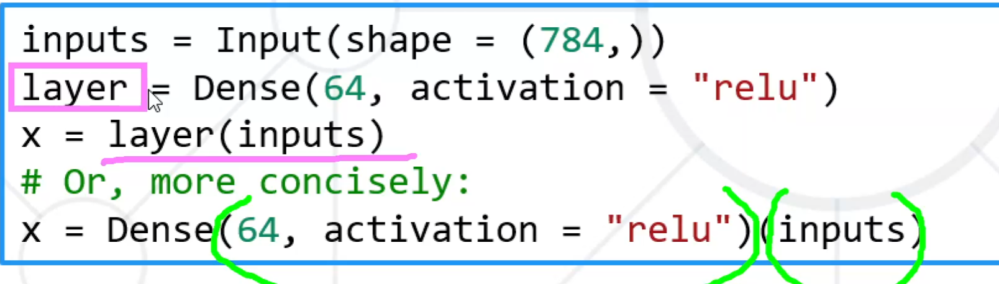

We create the layer and execute it with the inputs on one line. Butwhy do this?

Because of this.

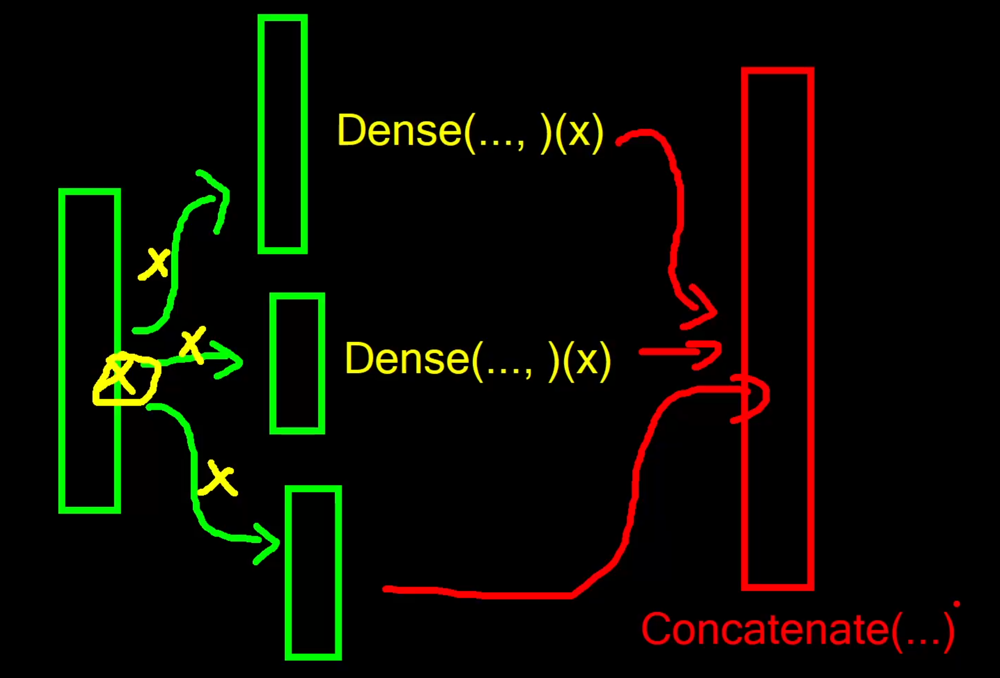

We can give the outputs of 1 layer to multiple other ones. It is not sequential anymore.

If the 3 layers that we have have differnet amout of neurons in them then we can do **Concatenation**. We combine them all into 1 layer.

If the 3 layers have the same amount of neurons we can do **Aggregation** on them. Perform a Sum/Division/Mean of the 1st with 1sts then 2nd with 2nd, 3rd with 3rd neurons and so on.

## Reusability

This Tensorflow API of reusability of layers allows us to make very complex NN architectures.

*Usually we don't do that with Dense() layers. We do it with Convolution, Attention, etc. We haven't gotten to them yet. Patience, young one.

In Tensorflow we can just use Sequential and not bother at all with these variables that we store the result of the layer to give it to the next layer.

In PyTorch that is the only way. It forces us to do it this way. 

Tensorflow seems to be a bit higher level for the more simple things.

## Eager vs Lazy evaluation

#### **Lazy** - Tensorflow

Tensorflow allows for simpler syntax by not specifying the inputs of a layer, but only the outputs. So how does it know what matrix to create? It does it run time. It is called **lazy evaluation** (Doesn't do the operation until the very last moment it has to, this is why it is faster. It prepared the operations and it executes them only when it needs them)

When it is run it sees what is the input that is given to the layer and then determines the input number.

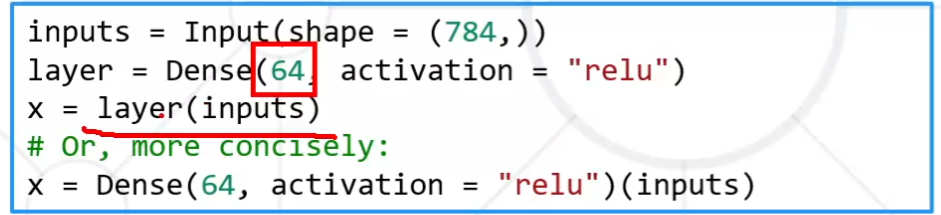

#### **Eager** - PyTorch

Does the caluculations immediately as it is initialized. Here the Dense layer needs to know the outs **AND THE INPUTS**

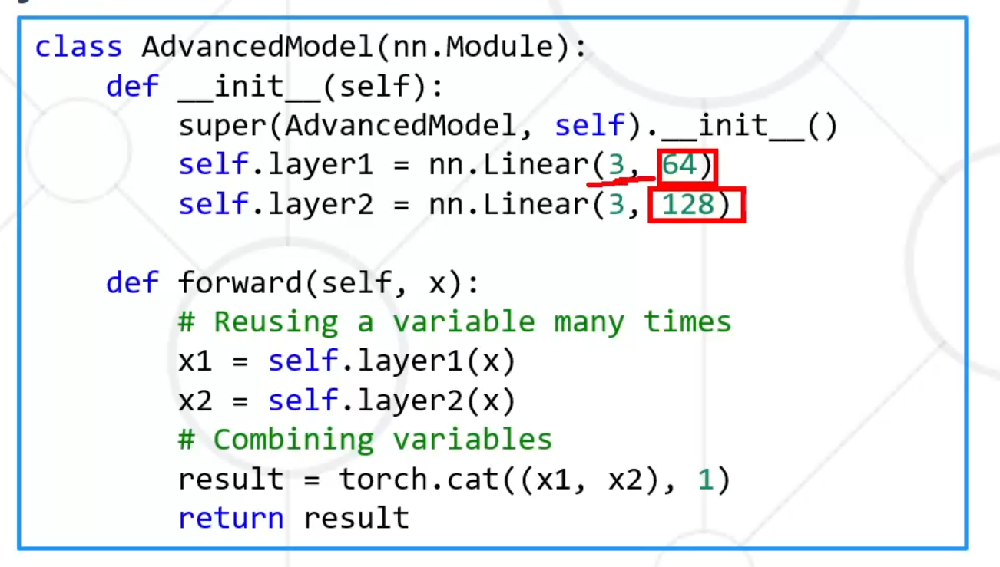


`It is very important to align your dimentions when connecting them. Otherwise it won't work. It is like Matrix multiplication.`

## Tensor Shape vs Rank

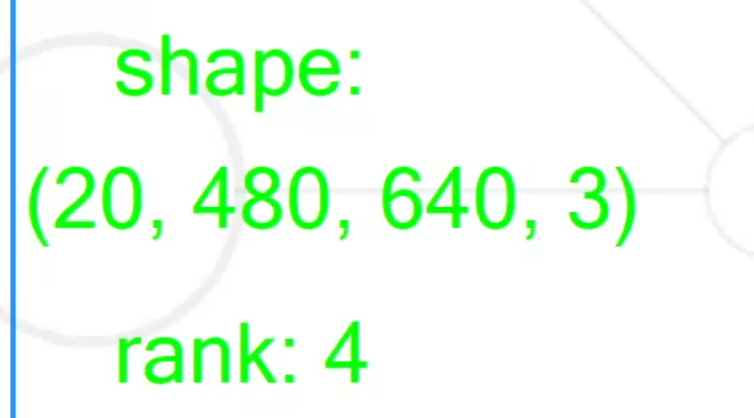

Rank - number of dimentions\
Shape - number of elements in all dimentions

```
Shape: The length (number of elements) of each of the axes of a tensor.
Rank: Number of tensor axes
```

$rank = len(shape)$

## Pipelines

In **Tensorflow** `tf.data.Dataset` is used to setup the pipelines for the preprocessing that is needed.\
In **PyTorch** there are 2:
- `torch.utils.data.Dataset` for the access to the data
- `torch.utils.data.DataLoader` for the transofrmations on the data

We will look into the TensorFlow way.


`tf.data.Dataset` doesn't just give you the building blocks for the preprocessing, it optimized the whole process to take less time:\
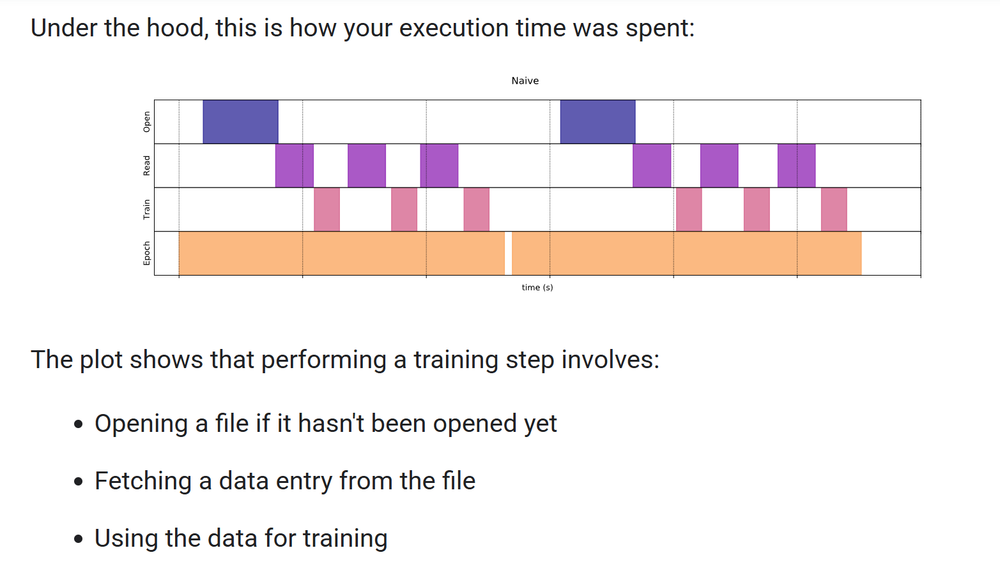

In a naive synchronous implementation, while your pipeline is fetching the data, your model is sitting idle. Conversely, while your model is training, the input pipeline is sitting idle. We don't want that.

The smart way would be to do prefetching. It overlaps the preprocessing and model execution of a training step. While the model is executing training step `s`, the input pipeline is reading the data for step `s+1`. Doing so reduces the step time to the maximum (as opposed to the sum) of the training and the time it takes to extract the data.

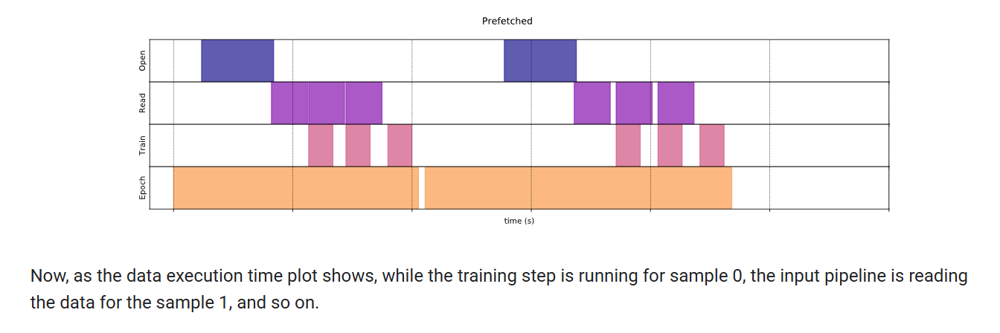

`It is really important how we pass the data to the NN. The whole process of trianing can take 3/4 times longer if you do it the wrong way`

## Demo (How to inherit more complex models)

In [28]:
import tensorflow as tf
import pandas as pd 

from keras.datasets.fashion_mnist import load_data
from keras.layers import Input, Flatten, Dense, Concatenate
from keras.models import Model
from keras.callbacks import TensorBoard, ModelCheckpoint

In [2]:
((attributes_train, labels_train), (attributes_test, labels_test)) = load_data()

In [3]:
attributes_train.shape, attributes_test.shape

((60000, 28, 28), (10000, 28, 28))

In [4]:
# We have all the numbers in the labels
len(set(labels_train))

10

In [5]:
# We can see we have a balanced sample of all classes
pd.DataFrame(labels_train).value_counts()

0
0    6000
1    6000
2    6000
3    6000
4    6000
5    6000
6    6000
7    6000
8    6000
9    6000
Name: count, dtype: int64

In [6]:
pd.DataFrame(labels_test).value_counts()

0
0    1000
1    1000
2    1000
3    1000
4    1000
5    1000
6    1000
7    1000
8    1000
9    1000
Name: count, dtype: int64

In [7]:
#We flattern all the images from a matrix to a vector
attributes_train.reshape(60000, -1).shape

(60000, 784)

In [8]:
input_layer = Input((28, 28))
input_layer

<KerasTensor shape=(None, 28, 28), dtype=float32, sparse=False, name=keras_tensor>

In [9]:
Dense(64)

<Dense name=dense, built=False>

In [10]:
# Notice the difference in the type
Dense(64)(input_layer)

I0000 00:00:1741609317.732228     566 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:08:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1741609317.930956     566 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:08:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1741609317.931018     566 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:08:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1741609317.934228     566 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:08:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1741609317.934287     566 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:08:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:0

<KerasTensor shape=(None, 28, 64), dtype=float32, sparse=False, name=keras_tensor_1>

`If we pass the images as (28, 28) in the Input then on the next layer we lose the first dimention because of the way Tensorflow works. So we have to flattern the image into a vactor.`

Now we cant do it with numpy or pandas because if the dataset is too big we cant get it in memory. Even if we can, why use numpy when we don't need it. 
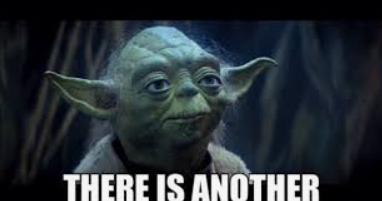 way

So we will use another transformation which does this **reshape** in tensorflow. It is called `Flatten`

In [11]:
input_layer

<KerasTensor shape=(None, 28, 28), dtype=float32, sparse=False, name=keras_tensor>

In [12]:
flatten_layer = Flatten()(input_layer)
flatten_layer

<KerasTensor shape=(None, 784), dtype=float32, sparse=False, name=keras_tensor_2>

We can see the input_layer is (None, 28, 28) and the Flatten is (None, 784), where None = the data we will be passing

In [13]:
layer1 = Dense(64)(flatten_layer)
layer1

<KerasTensor shape=(None, 64), dtype=float32, sparse=False, name=keras_tensor_3>

In [14]:
# All in the same place now
# They should be called inpiut_activation, since they are not the layers but the tensor result of the activated layer

input_layer = Input((28, 28))
flatten_layer = Flatten()(input_layer)
layer1 = Dense(64, activation = "relu")(flatten_layer)
layer2 = Dense(128, activation = "relu")(layer1)
layer3 = Dense(64, activation = "relu")(layer2)
output_layer = Dense(10, activation = "softmax")(layer3)

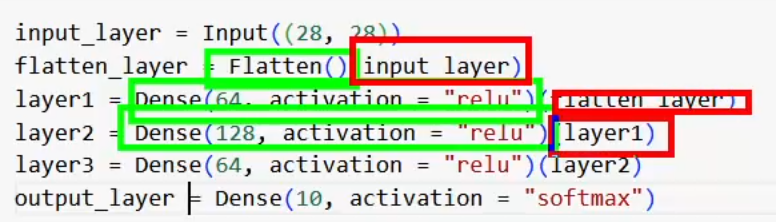

We are doing 2 things here:
- Green - defining the layers
- Red - connecting them

Right now all we have is a graph of layers. We don't have a model.

We don't know how to pass data to it\
We don't know how to get any outputs

In [15]:
model = Model(inputs = input_layer, outputs = output_layer)

In [16]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 28, 28)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 64)             │        50,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 67,466 (263.54 KB)

 Trainable params: 67,466 (263.54 KB)

 Non-trainable params: 0 (0.00 B)

### Why we don't use Dense with images

At the dense_4 layer we see params = 50,240 which is way too much for such a small image. We will be using Convolutions, but that is for the next lecture.

## Let's try some different architectures other than Squential

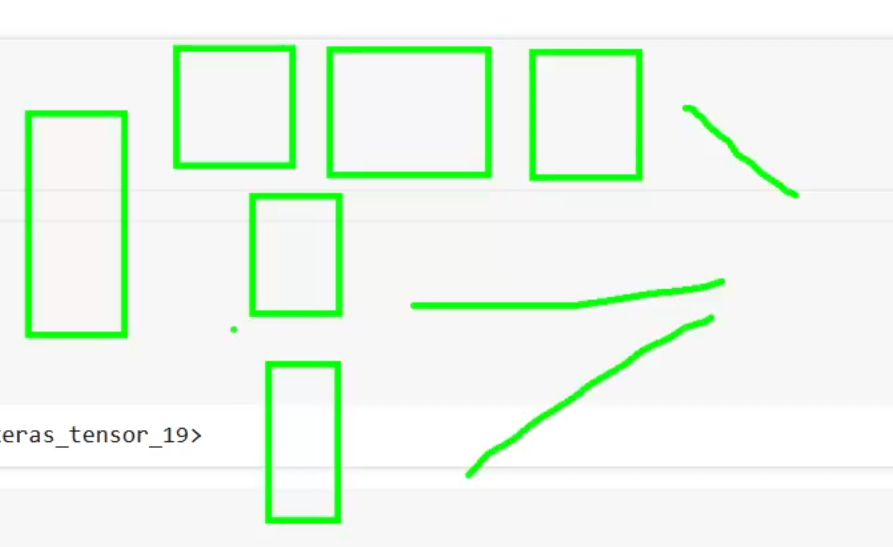

In [17]:
# These things are called blocks hence ...
block_beginning = Dense(20, activation = "relu")(flatten_layer)

block_a1 = Dense(30, activation = "relu")(block_beginning)
block_a2 = Dense(11, activation = "relu")(block_a1)
block_a3 = Dense(11, activation = "relu")(block_a2)

block_b = Dense(20, activation = "relu")(block_beginning)
block_c = Dense(50, activation = "relu")(block_beginning)

block_end = Concatenate()([block_a3, block_b, block_c])

In [18]:
block = Model(inputs = block_beginning, outputs = block_end)
block.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ keras_tensor_10CLO… │ (None, 20)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_8 (Dense)     │ (None, 30)        │        630 │ keras_tensor_10C… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_9 (Dense)     │ (None, 11)        │        341 │ dense_8[1][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_10 (Dense)    │ (None, 11)        │        132 │ dense_9[1][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_11 (Dense)    │ (None, 20)        │        420 │ keras_tensor_10C… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_12 (Dense)    │ (None, 50)        │      1,050 │ keras_tensor_10C… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 81)        │          0 │ dense_10[1][0],   │
│ (Concatenate)       │                   │            │ dense_11[1][0],   │
│                     │                   │            │ dense_12[1][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 2,573 (10.05 KB)

 Trainable params: 2,573 (10.05 KB)

 Non-trainable params: 0 (0.00 B)

`plot_model` doesn't work for me here so I will show pictures of the lecture:

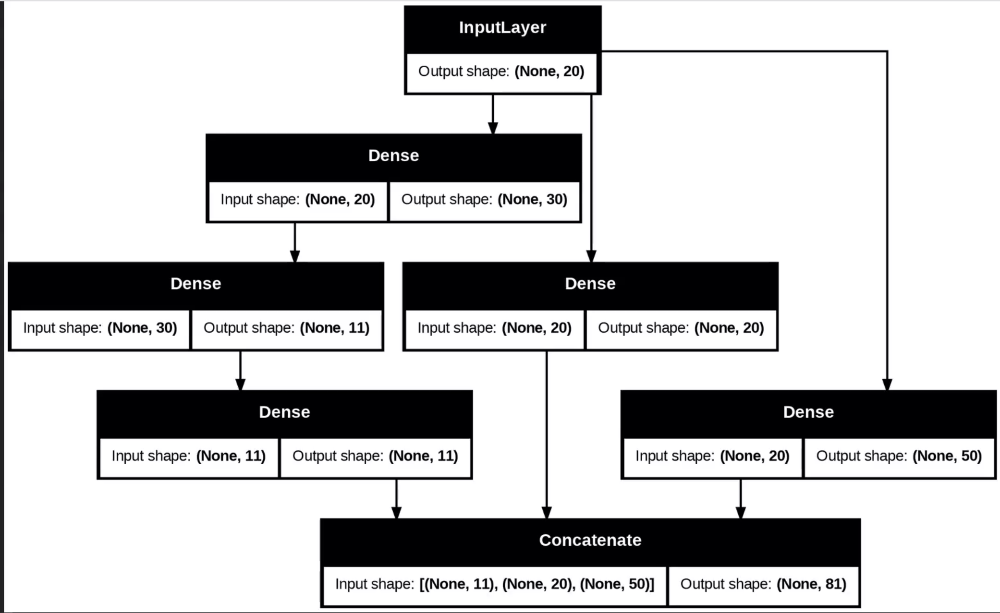

In [19]:
final_block_layer = Dense(20, activation = "relu")(block.output)

## Can we create a Model of a Model?

In [20]:
Model(inputs = block.input, outputs = final_block_layer).summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ keras_tensor_10CLO… │ (None, 20)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_8 (Dense)     │ (None, 30)        │        630 │ keras_tensor_10C… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_9 (Dense)     │ (None, 11)        │        341 │ dense_8[1][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_10 (Dense)    │ (None, 11)        │        132 │ dense_9[1][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_11 (Dense)    │ (None, 20)        │        420 │ keras_tensor_10C… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_12 (Dense)    │ (None, 50)        │      1,050 │ keras_tensor_10C… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 81)        │          0 │ dense_10[1][0],   │
│ (Concatenate)       │                   │            │ dense_11[1][0],   │
│                     │                   │            │ dense_12[1][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_13 (Dense)    │ (None, 20)        │      1,640 │ concatenate[1][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 4,213 (16.46 KB)

 Trainable params: 4,213 (16.46 KB)

 Non-trainable params: 0 (0.00 B)

Yes we can. Tensorflow allows you to do almost anything. It is pretty cool.

In [21]:
model.compile(loss = "sparse_categorical_crossentropy", optimizer = "adam", metrics=["accuracy"])

## What if we need a custom Loss function? 

We can call another loss inside our own or make it do w/e we need.

```
class DoubleClassificationLoss(tf.keras.losses.Loss):
    def call(self, y_true, y_pred):
        return tf.keras.losses.sparse_categorical_crossentropy().call(y_true[0],y_pred[0])

loss_function = DoubleClassificationLoss()

model.compile(loss = loss_function, optimizer = "adam", metrics=["accuracy"])
```

In [22]:
model.fit(attributes_train, labels_train, epochs = 10)

Epoch 1/10


I0000 00:00:1741524429.570611     752 service.cc:146] XLA service 0x7f9d54003e10 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1741524429.570648     752 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 2060 SUPER, Compute Capability 7.5
2025-03-09 14:47:09.615680: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-03-09 14:47:09.726728: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 90100


 121/1875 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4572 - loss: 13.7352

I0000 00:00:1741524430.691919     752 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step - accuracy: 0.6506 - loss: 2.7790
Epoch 2/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - accuracy: 0.7796 - loss: 0.6272
Epoch 3/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8112 - loss: 0.5506
Epoch 4/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8303 - loss: 0.4745
Epoch 5/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8350 - loss: 0.4613
Epoch 6/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8446 - loss: 0.4358
Epoch 7/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8521 - loss: 0.4148
Epoch 8/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - accuracy: 0.8534 - loss: 0.4071
Epoch 9/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8552 - loss: 0.4007
Epoch 10/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8600 - loss: 0.3953


## Metrics

Accuracy works well with all, but for multiple classes:
- Precision
- Recall
- F1

are made just for 2 classes. You need to specify how to average it: by class, by datapoint or globally

*micro_averaged, macro_averaged, accuracy

## Precompile

We can compile -> fit() or train the model with a certain loss function and then precompile it with another and continue training. Nothing would be lost.

Think of it like: You can give the model another direction

`If we have too much data and the model is slow to start the learning process. What we can do is give it a simpler task and then once it learned a bit recompile with the initial loss function`

A common practice is also to tweak the learning rate

In [23]:
model.evaluate(attributes_test, labels_test)

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8516 - loss: 0.4367


[0.4514370560646057, 0.8446999788284302]

## Ways to break things

1. Not connect the layers as intended
2. Too many parameters in the model -> regularize or add more data

## [Rectified Linear Unit (ReLU)](https://builtin.com/machine-learning/relu-activation-function)

$ReLU = max(0, x)$

Sigmoid and tanh were monotonous, differentiable and previously more popular activation functions. However, these functions suffer saturation over time, and this leads to problems occurring with vanishing gradients. An alternative and the most popular activation function to overcome this issue is the Rectified Linear Unit (ReLU).

```
A rectified linear unit (ReLU) is an activation function that introduces the property of non-linearity to a deep learning model and solves the vanishing gradients issue. "It interprets the positive part of its argument. It is one of the most popular activation functions in deep learning. 
```
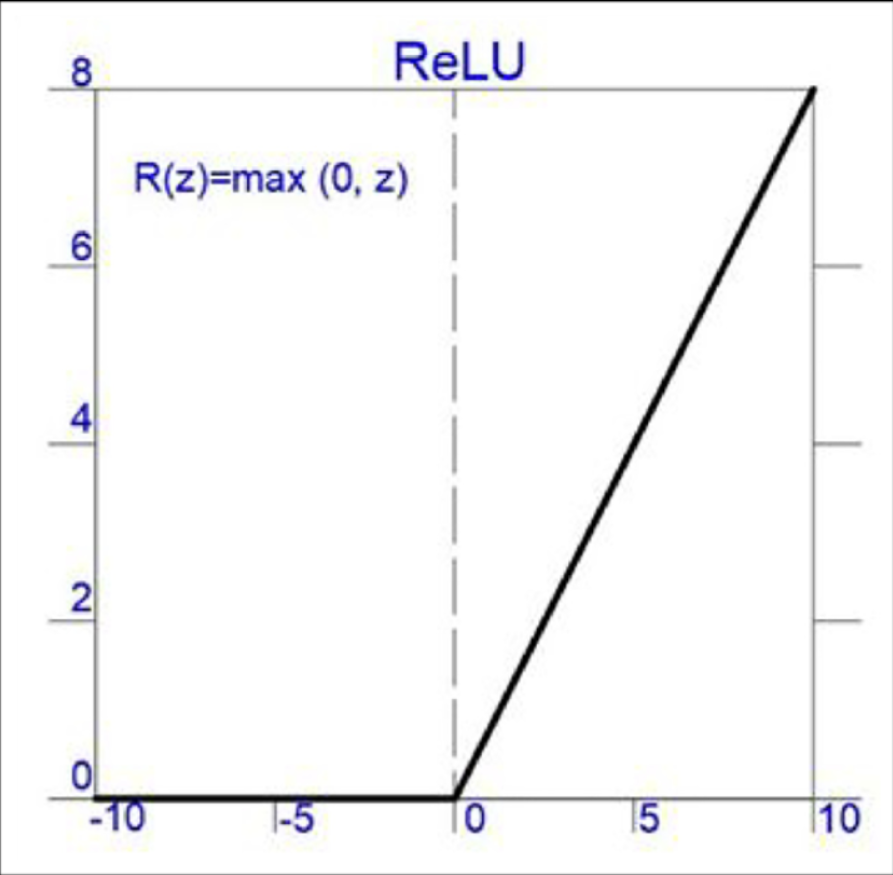
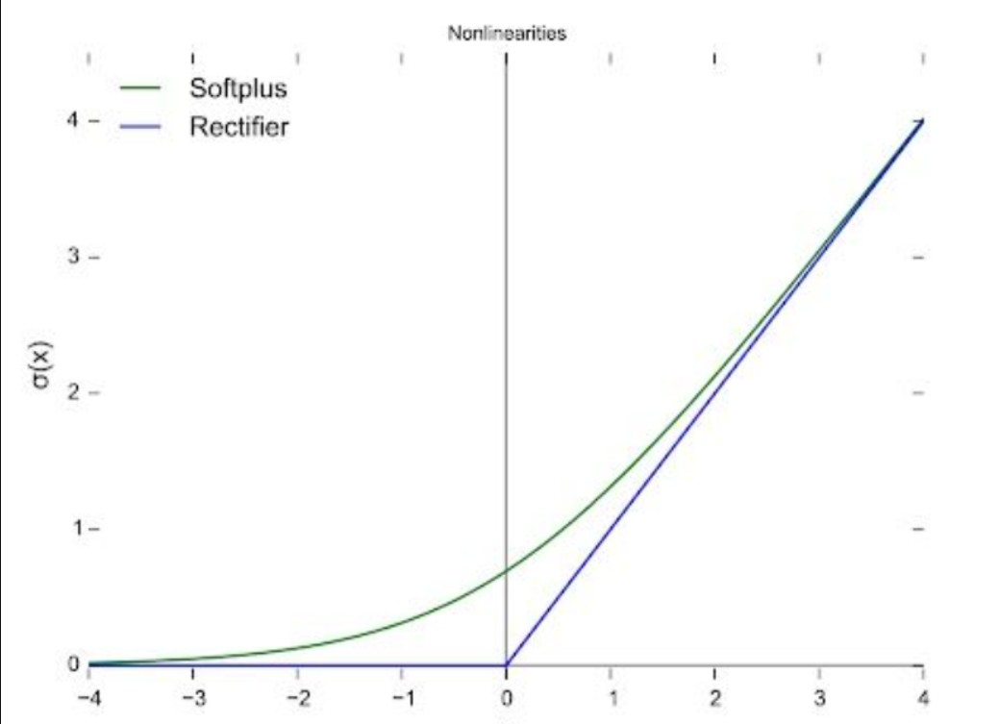

### [Proof that ReLU is better than previously used Sigmoid](https://www.cs.toronto.edu/~fritz/absps/reluICML.pdf)

## General rule to decide on activation function

`There are many activation functions out there. They are all created to serve a very specific architecture. In practice if we don't have a very good reason to use one of them we should default to ReLU`

The activation function is one of the last hyperparams that we optimize.

If we get a NaN with ReLU, we should change it. It doesn't have a derivative at 0, that is why we get NaN

# Bias and Variance

## Regularization

### 1. This is the ML approach
We learned about L1 and L2 regulariation in  th eML course. L1 comes from Length 1 or Norm(length) 1. Aka |w|, L2 is $w^2$

We can do regularization (add the weights to the loss function) in 3 ways because we have 3 types of parameters:
 - input params for the neuron
 - bias term
 - activation value after the neuron
   
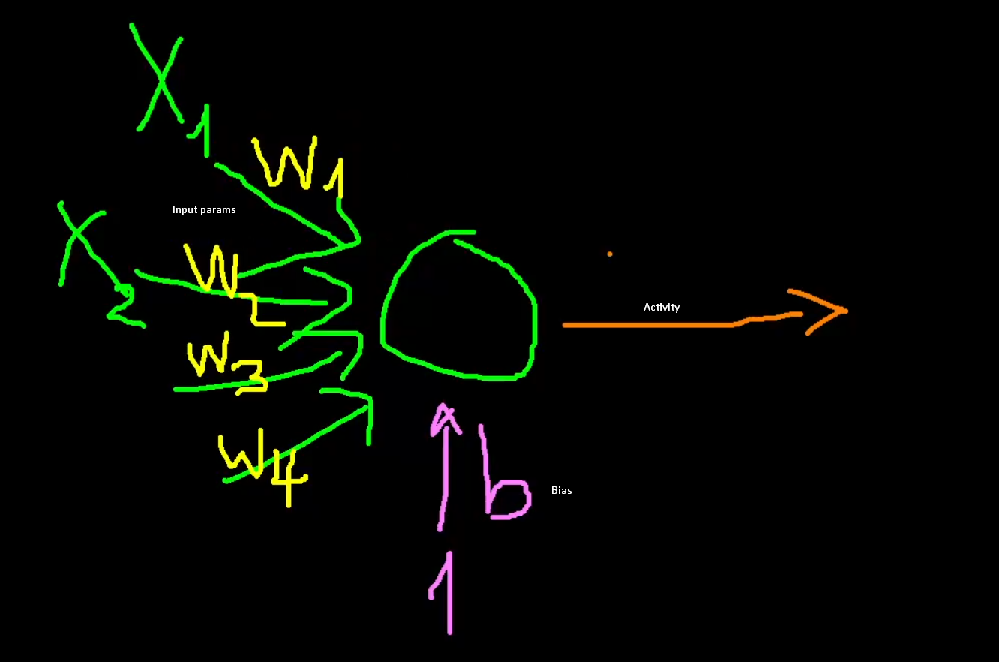

#### *Most often we skip the `activity_regularizer` and `bias_regularizer` regularization and we just do the `kernal_regularizer`

### 2. The DNN approach - [Dropout](https://www.cs.toronto.edu/~rsalakhu/papers/srivastava14a.pdf)

But in NN there is a better way to add regularization!

It is called [**Dropout**](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dropout)

We use it ONLY! during the **TRAINING** period! **DO NOT USE DURING INFERENCE** (Tensorflow takes care of this)

With **EACH** step we choose a rate of neurons that will be deactivated for this particular step only and train the NN like that.
Next step we choose at random another set of neurons to deactivate and so on. This simplifies the model and regularizes it.

Dropout does allow the NN to have connections that are too strong. In a way it forces the loss function to optimize for the weights to be smaller just like in ML regularization. Because sometimes that strong neuron connection will be deactivated and it will look for other ways to optimize the loss function.

The dropout rate is usually between [0.1, 0.5]

If used just after the input layer it performs a sort of "feature selsection" / "data denoising"

*Here dropout is applied to all the layers
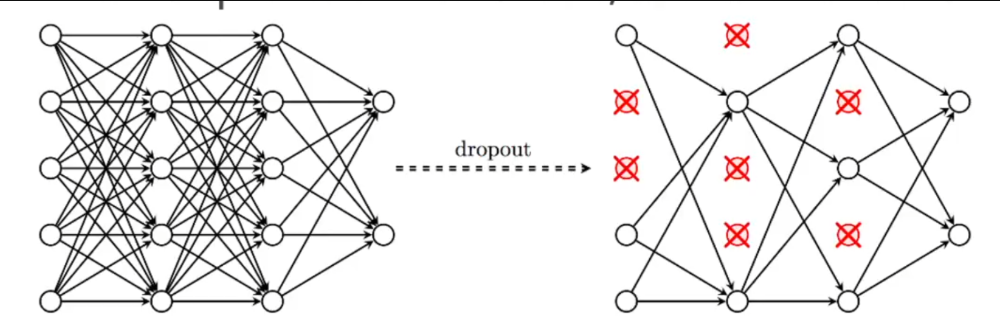

The connections actually exist. They are just multiplied by 0.

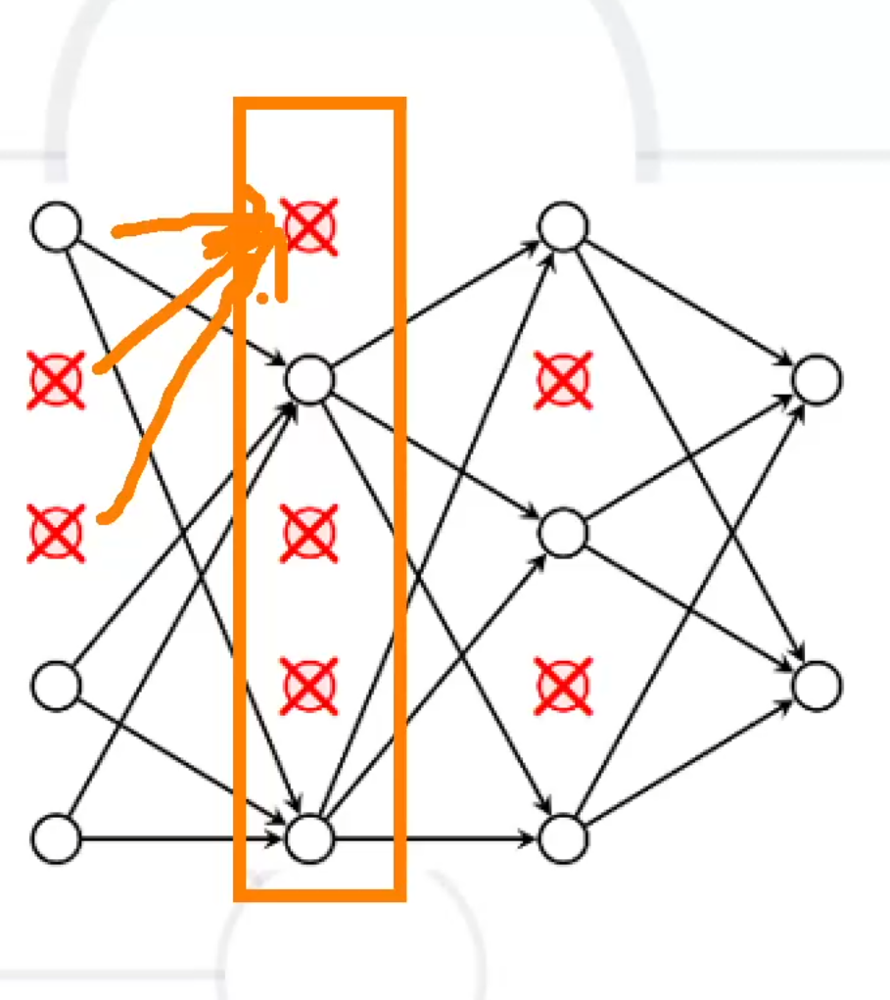

A lot of people interpret this the wrong way. We are not making the model smaller (If we were, we would have done that from the get go), we are making it dumber. In each training step we are just disabling some paths, but they still exist. And when we make inference we do it on the whole original model. 

In the ML regularization lets say L1, when some of the weights become really small or 0, in comparison the rest become bigger. For this reason, to mimic the same relationship when we do regularization with Dropout we scale the remaining weights, that we didn't remove, with $ \frac{1}{1 - p} $ if we remove $p$ neurons

From the Dropout paper
```
The idea is to use a single neural net at test time without dropout. The weights of this network are scaled-down versions of the trained weights. If a unit is retained with probability p during training, the outgoing weights of that unit are multiplied by p at test time as shown in Figure 2.
```



Rather than adding ops to scale down the weights by `keep_prob` at test time, the TensorFlow implementation adds an op to scale up the weights by `1 / keep_prob` at training time. The effect on performance is negligible, and the code is simpler

Let's say the network had `n` neurons and we applied dropout rate `1/2`

Training phase, we would be left with `n/2` neurons. So if you were expecting output x with all the neurons, now you will get on `x/2`. So for every batch, the network weights are trained according to this `x/2`

Testing/Inference/Validation phase, we dont apply any dropout so the output is `x`. So, in this case, the output would be with `x` and not `x/2`, which would give you the incorrect result. So what you can do is scale it to `x/2` during testing.

Rather than the above scaling specific to Testing phase. What Tensorflow's dropout layer does is that whether it is with dropout or without (Training or testing), it scales the output so that the sum is constant.

### Attension - Droput is used **AFTER** the layer we want to apply it to

In [35]:
from keras.layers import Dropout
Dropout(0.1)

<Dropout name=dropout, built=True>

In [ ]:
input_layer = Input((28, 28))
flatten_layer = Flatten()(input_layer)
layer1 = Dense(64, activation = "relu")(flatten_layer)
layer2 = Dense(128, activation = "relu")(layer1)
layer2 = Dropout(0.1)(layer2) # We can override the layer activation variable with the dropout one
layer3 = Dense(64, activation = "relu")(layer2)
output_layer = Dense(10, activation = "softmax")(layer3)

Dropout, Flatten, Concatenate and others like that are made to look and use like NN layers but they are just processes that are plugged inbetween the layers for ease of use.

Sequential() is like a pipeline and we just add stuff to it.

Dropout after the Input layer is kind of like Undersampling in Ensambles in the startart ML. It removes some of the features on different data points. Not recommended here.\
With CNN it is very bad. We use a different type of Dropout there

## Bias-Variance Error Analysis

Forget the word **Tradeoff** for Bias-Variance. It doesn't exist. 

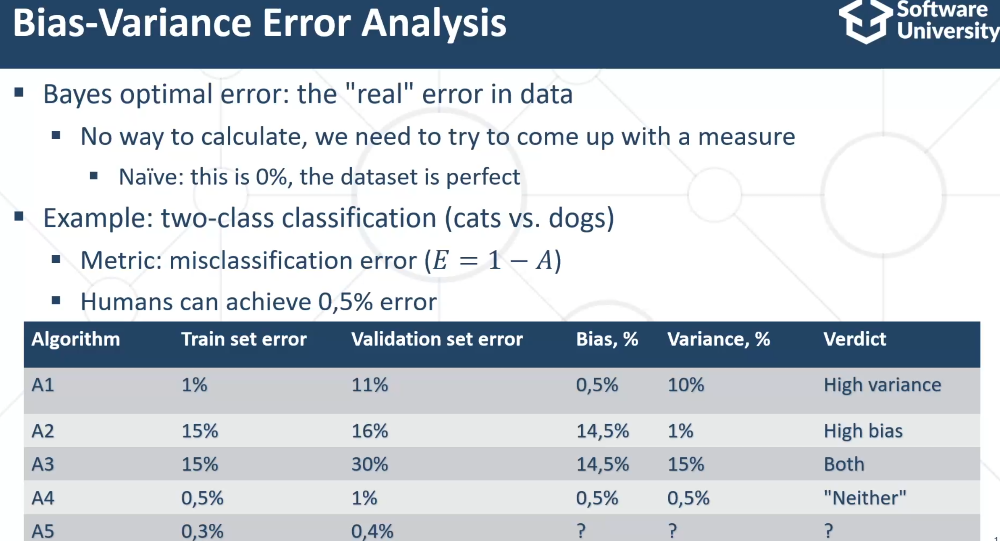

Always test externally - on data that the model has not seen. From Gödel's incompleteness theorems we know that `No system can judge itself accurately`, that is why we test externally. If the model knew if it was correct or not it would be 100% correct in the first place.

1. Variance - Dispertion, The difference between what the algorithm is being thought and what we are testing it on.
 - If it is paying attension to small details and it doesn't generalize well (meaning the validation set error is higher than the test set) it means it has high variance
2. Bias - The difference between the errors that we expect from an external metric (in the picture it is the human perception 0,5% - Bayesian optimal error) and what the algorithm manges is what we call bias.
   - Simpler: Diffrence between Bayesian Optimal Error and the model's error is bias
  
Bias and Variance are specific to the combination between the data and the algorithm.

## Solutions to Bias and Variance
Some ideas here, no rules, just things to try

High Bias
- Train a bigger network
- Try ou different architectures
    - Try to find one which is best suited for the task
- Train for longer (more epochs)

High Variance
- Apply regularization
- Try a smaller network architecture
- Get more data
    - Or try to augment the current dataset (Bootstrap sampling, image rotation, adding noise, etc.)

## Checking how the training has gone

In [18]:
input_layer = Input((28, 28))
flatten_layer = Flatten()(input_layer)
layer1 = Dense(64, activation = "relu")(flatten_layer)
layer2 = Dense(128, activation = "relu")(layer1)
layer3 = Dense(64, activation = "relu")(layer2)
output_layer = Dense(10, activation = "softmax")(layer3)

In [19]:
model = Model(inputs = input_layer, outputs = output_layer)
model.compile(loss = "sparse_categorical_crossentropy", optimizer = "adam", metrics=["accuracy"])

we can use `validation_split=0.0,` parameter in `model.fit(...)` to validate the training, but we will skip it for now

In [21]:
model.fit(attributes_train, labels_train, epochs = 10, callbacks = [TensorBoard()])

Epoch 1/10


I0000 00:00:1741609647.263058    3571 service.cc:146] XLA service 0x7f73d400ab50 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1741609647.263092    3571 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 2060 SUPER, Compute Capability 7.5
2025-03-10 14:27:27.312420: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-03-10 14:27:27.434276: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 90100


  25/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.2397 - loss: 42.1647     

I0000 00:00:1741609648.649809    3571 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1875/1875 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.6696 - loss: 3.3900 
Epoch 2/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8064 - loss: 0.5516
Epoch 3/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8325 - loss: 0.4714
Epoch 4/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8444 - loss: 0.4354
Epoch 5/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8504 - loss: 0.4120
Epoch 6/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8561 - loss: 0.3952
Epoch 7/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8625 - loss: 0.3791
Epoch 8/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8646 - loss: 0.3751
Epoch 9/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8685 - loss: 0.3595
Epoch 10/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8708 - loss: 0.3628


In [25]:
%load_ext tensorboard

In [26]:
%tensorboard --logdir logs

## Checkpoints `ModelCheckpoint`

If we are training a large amount of epochs and it will take hours, what we can use is checkpoints. Let's say we are training 2000 epochs overnight. But by the 2000th epoch model will overfit probably and we want to use a prior version that doesn't. We can do this by checkpoints. Instead of sitting there and watching over it. We can then just revert to an older checkpoint that we like and voila! 

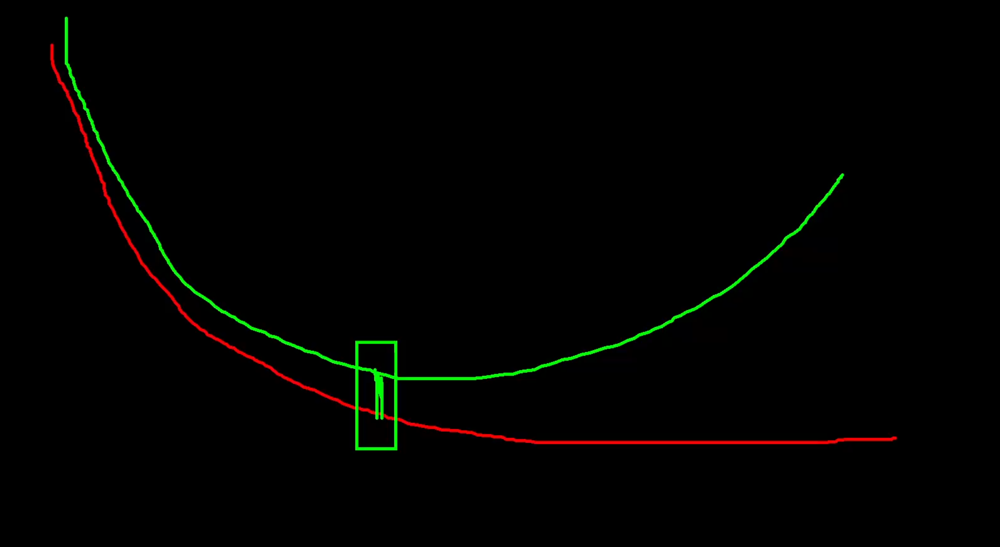

[We can then use](https://www.tensorflow.org/guide/keras/serialization_and_saving)  
- Save - `model.save('path/to/location.keras')`
- Load - `model = keras.models.load_model('path/to/location.keras')`

for storing and loading the model for next day

## Optimization

For the standard ML algos the hyperparams are very important, here with DNN it is the opposite.

The DNN are huge and their architecture isnt that important, if we have 50 or 58 units it is w/e.\
**The proccess of learning is much more important though**

The main thing we lookout for and pay attention to is **Gradient Descent**, we wont be touching the architecture at all mostly

The process of training is important. We tune:
- Which gradient descent we use
- The Optimizer function we use
- What learning rate we use
- Batch size, etc. (how fast and how careful it takes data in)

## Vanishing / Exploading gradient problem

DNN can learn very complex problems, but their depth creates issues.

Take, for example the acivation at the 15th layer.
- Ignoring all the activation functions for simplicity
- The 15th layers weights depend on all the other layers' weights before it.
    - 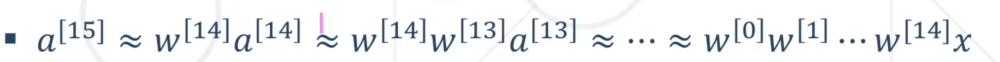

This means we have 15 multiplications. Let's see what happens:
- If some elements of  $w \ge 1$ the product `w15` will become huge
- If some elements of  $w \le 1$ the product `w15` will become tiny

This leads to problems when updaing the weights: $ w = w - \Delta * w $ 
- The gradients either become:
    -  close to $ \infty $
    -  or close to $ 0 $

This problem occurs usually in the beginning of the training, then it learn the proper weights

**_Vanishing gradient problem:_** In machine learning, the vanishing gradient problem is encountered when training artificial neural networks with gradient-based learning methods and backpropagation. In such methods, during each iteration of training each of the neural networks weights receives an update proportional to the partial derivative of the error function with respect to the current weight.[1] The problem is that in some cases, the gradient will be vanishingly small, effectively preventing the weight from changing its value.[1] In the worst case, this may completely stop the neural network from further training.[1] As one example of the problem cause, traditional activation functions such as the hyperbolic tangent function have gradients in the range (0,1], and backpropagation computes gradients by the chain rule. This has the effect of multiplying n of these small numbers to compute gradients of the early layers in an n-layer network, meaning that the gradient (error signal) decreases exponentially with n while the early layers train very slowly.

**Further explanation:** In the example we use backprogation which starts from the last layer and moves back to the first layer (hence BACK-propagation). If we use this hyperbolic tangent function:

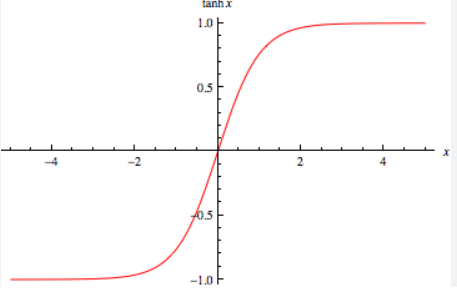

We see that the Range is [0;1] and due to the chain rule of derivatives the gradient will become smaller and smaller since we keep multiplying by a number that $\in$ [0,1]. Since we do it from the back to the front the last layers will be chaning but the first ones in the worst case might not at all.

## Solution to Vanishing Gradients

**Initialize the weights properly**

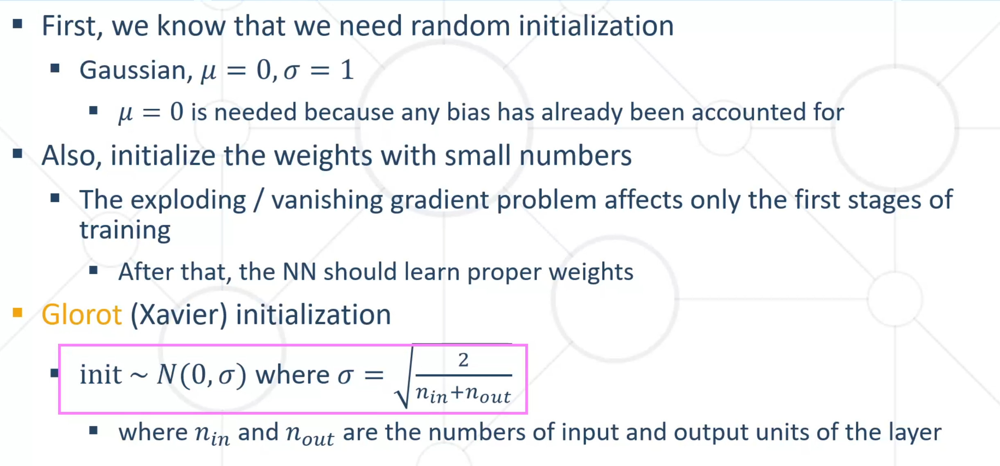

Glorot is the most popular way to initialize the weights. It takes into account the number of weights that come in and out of a layer when initializing its weights.

The more weights we have the smaller Sigma is -> closer to 0 the weights' values are

```
from tensorflow import glorot_normal_initializer, zeroes_initilizer

layer = Dense(
    kernel_initializer = tf.glorot_normal_initializer(),
    bias_initializer = tf.zeroes_initilizer())
```


In [36]:
import matplotlib.pyplot as plt 

weights_flattened = model.layers[2].weights[0].numpy().flatten()

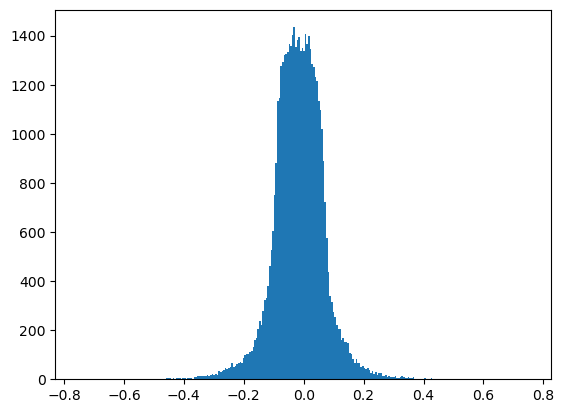

In [39]:
plt.hist(weights_flattened, bins = "fd")
plt.show()

We can see they approximate a Gaussian distribution

## Mini-batch Gradient Descent

In ML we call it .partial_fit(), here in DL it is just .fit()

It takes a lot of time to pass through the entire dataset to perform only 1 step of GD (batch gradient descent)
- Solution: take a random sample (mini-batch) each time: mini-batch gradient descent
- If the mini-batch contains one sample ⇒ stochastic GD (SGD)

The cost function will not decrease smoothly
- But will tend to decrease, also the training will be faster

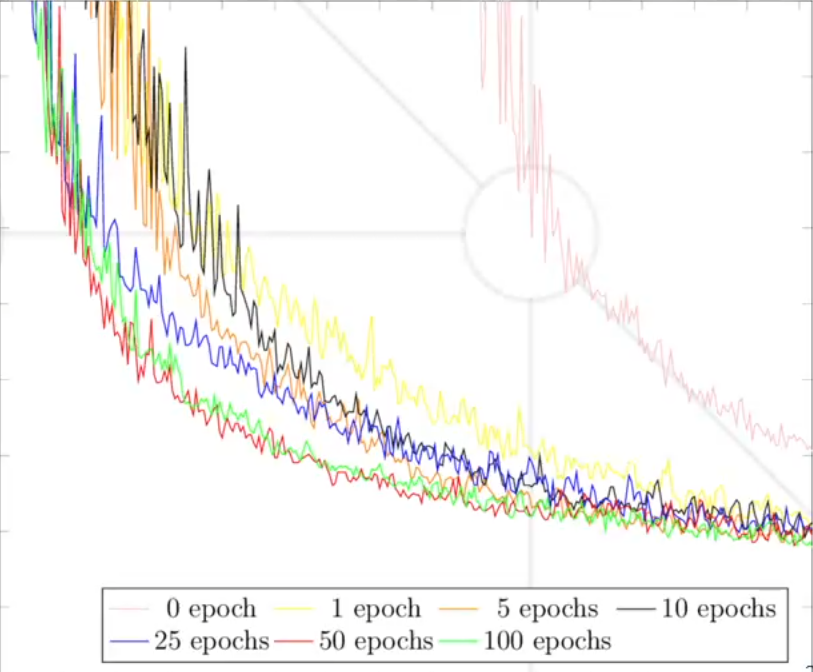

The RAM needs to be enough to fit:
- The model (which is the biggest chunk)
- A batch of data

Batch_size usually is powers of 2 (2, 4, 8, 16 ...)

- **Small batch size** -> a lot of iterations, the loss function is edgy (up and down)
- **Big batch size** -> we are losing time, smoother loss function, but each step won't lead to to a lot of improvement, so we will have to take more steps to finish the learning process


## Improving GD
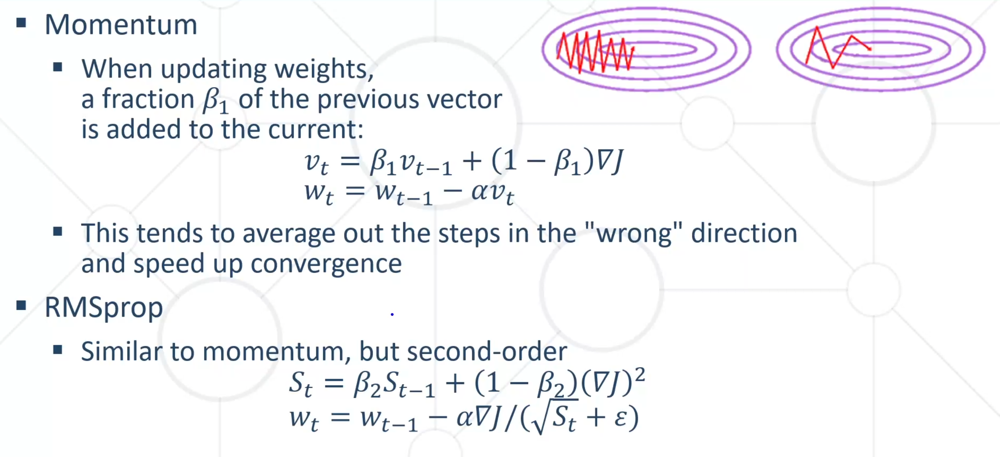

RMSprop (Root mean square propagation)

Momentum explained:\
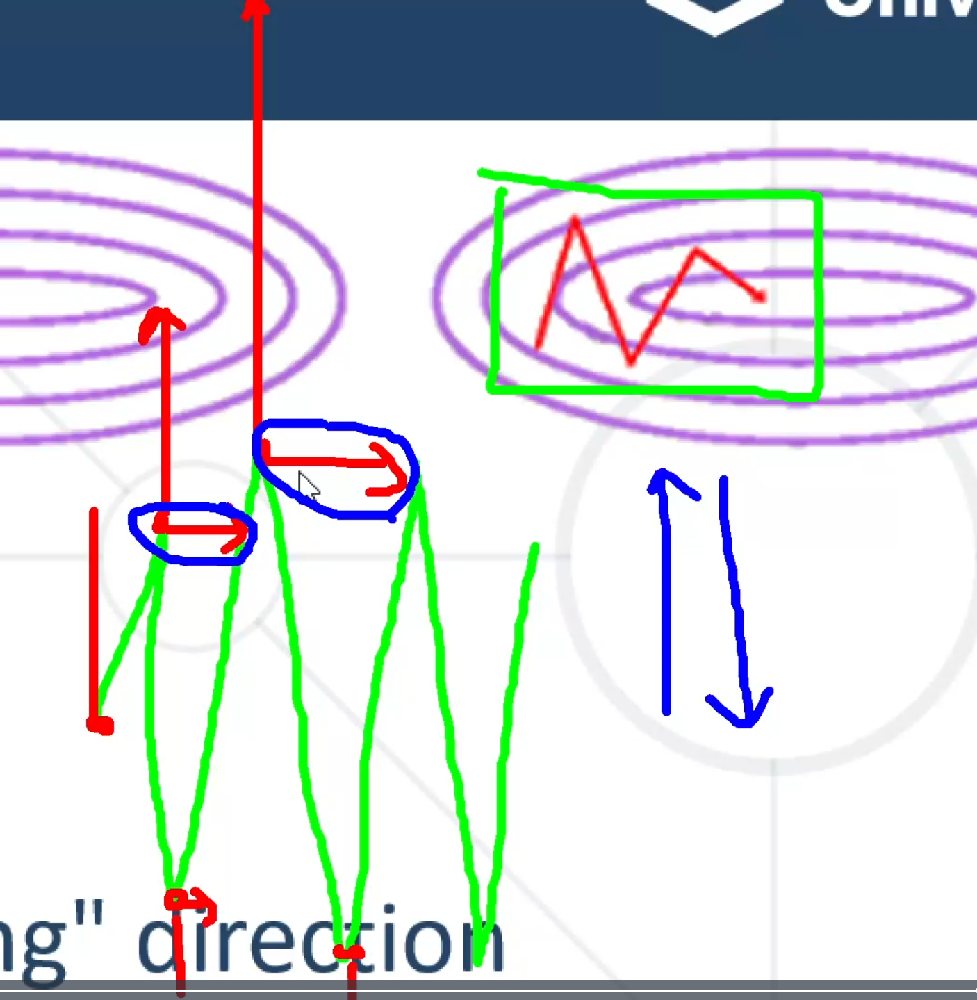

We add up the horizontal(vectors moving us towards the goal) and the orthogonal ones to them will cancel out( the blue ones)

## Adam Optimizer ( Adaptive Moment Estimation, Kingma & Ba; 2014)
- Combines momentum and RMSprop
- Usually: $\alpha$ (tuning); $\beta_1$ = 0,9; $\beta_1$ = 0,999; $\epsilon \in [ 10^{-6} ; 10^{-8} ]$

#### Usage
- In place of `GradientDescentOptimizer`
- It's best to tune all hyperparameters but we may skip $\beta_1 , \beta_1$
    - Tuning $\alpha$ is non-negotionable
    - 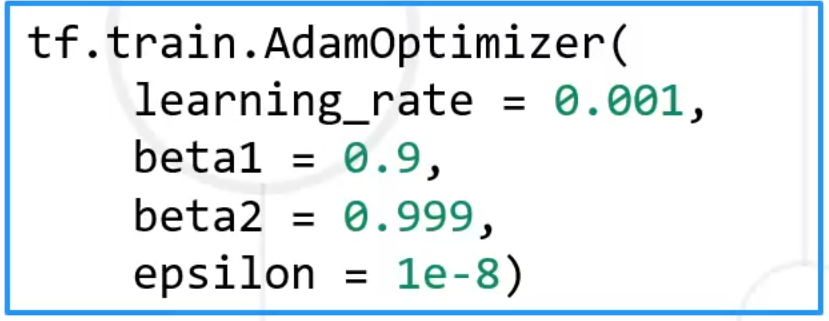
    - $ \epsilon $ helps up avoid division by 0, if we see NaNs, we can increase it

## Local Minima
When training a model, GD and similar algorithms may get stuck in a local minimum

If we think we are in local minimum, we can reinitialize the model

## Prioritizing Hyperparameters

Most important: 
- Learning rate 𝛼
- Momentum term 𝛽1, mini-batch size 𝑛𝑏
- Number of hidden units
- Number of hidden layers
- Search methodology
    - Grid search doesn't work (too large search space)
    - Use random search or Bayesian search instead
        - Optuna examples: [tensorflow](https://github.com/optuna/optuna-examples/blob/main/tensorflow/tensorflow_eager_simple.py)

From the above we see: 1st the process of learning, then the architecture

If we have a smaller model we can try GridSearch. We can basically forget about GridSearch in DNN.

If not we can try RandomSearch, [HyperOpts](https://hyperopt.github.io/hyperopt/) or [Optuna](https://optuna.org/)
Optuna is better, HyperOpt creates issues

## Hyperparameter Scales
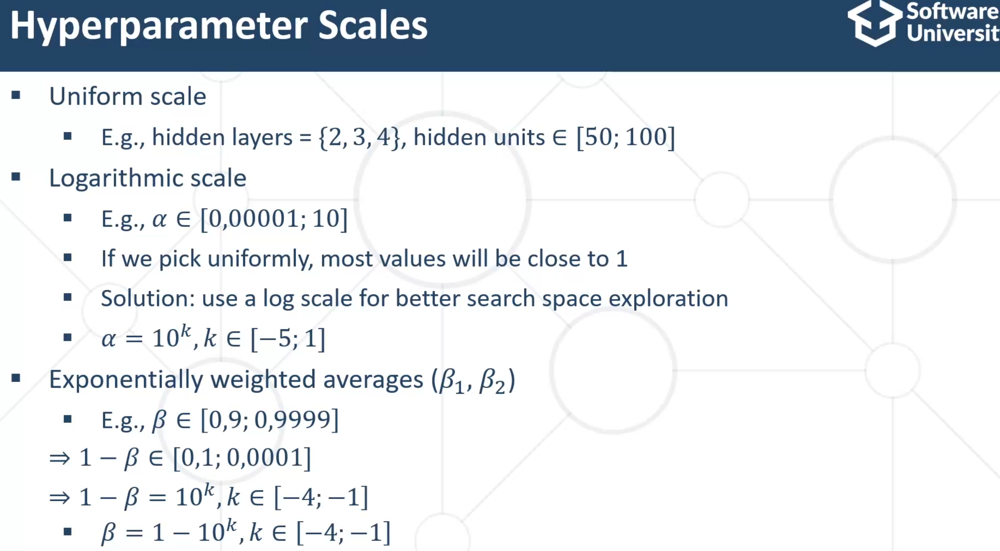

## Batch Normalization

Usually we do Z-score, but what if the data is too big and we can "see" it all at the same time. We cant apply that transformation.

What we do is Z-score only on the batch that we are seeing, hoping it when we do it for all the batches individually. They become slightly different mu and sigma.


We can use BatchStandartScale to normalize the data between layers, so they don't perhaps exponentially grow.\
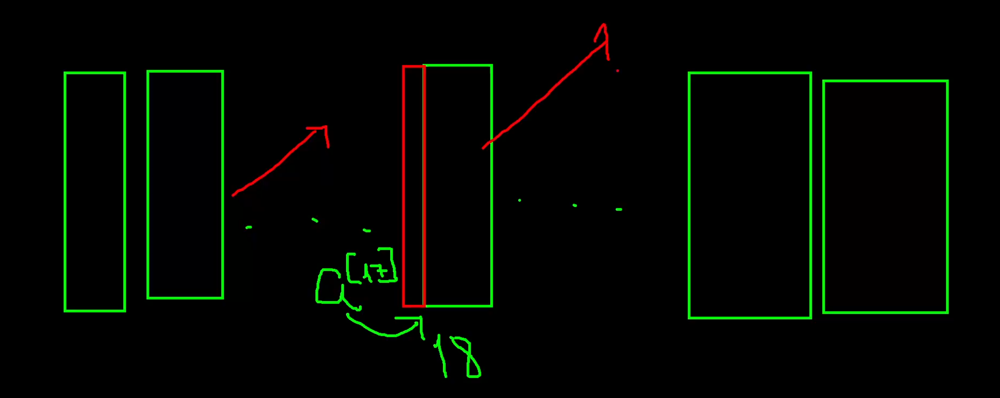

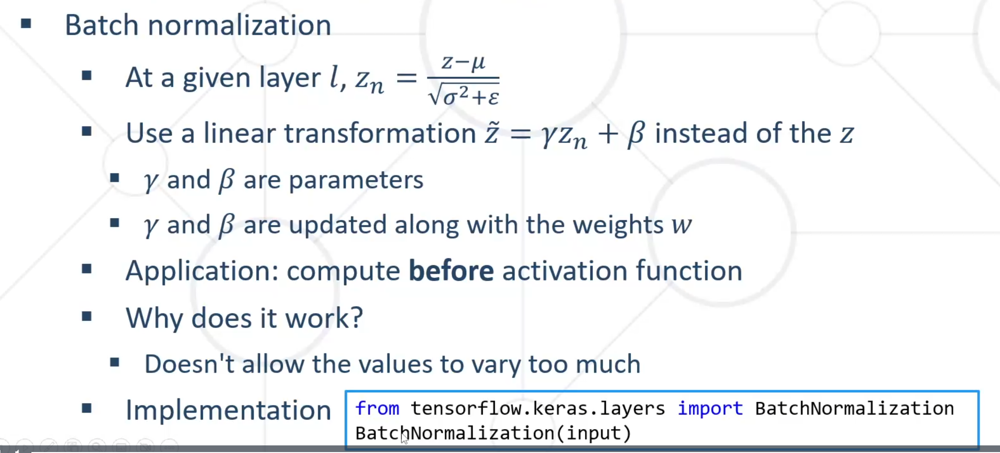

## Conclusion
We looked into:
- Weights - the weights in the neurons
- Activations - result after a layer's activation
- Gradients - values with which we update the weights of the NN in back-propagation

and they are **different**. We looked into ways to temper with all of them to avoid common issues:
- Regulatization
- BatchScaling
- Momentum

They all have the same issue, their values can become very big or very small.